# Importando los datos y librerias 

In [ ]:
!pip install pycountry_convert

In [ ]:
!pip install geopandas

In [ ]:
!pip install mariadb

In [39]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import mariadb
import pycountry_convert as pc
import plotly.express as px

from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import PolynomialFeatures
from sklearn.metrics import mean_squared_error

In [ ]:
dataset = pd.read_csv("GCB2022v27_MtCO2_flat.csv")
dataset

Existen datos con valores *Nan* y países que no poseen columna ISO 3166-1 alpha-3

In [ ]:
print('That countries correspond to {} rows in the dataset.'.format(len(dataset[dataset['ISO 3166-1 alpha-3'].isna()])))
print('The countries are: ')
for i in dataset[dataset['ISO 3166-1 alpha-3'].isna()]['Country'].unique():
    print("- "+ i)

# Limpiando los datos 

In [ ]:
dataset = dataset[dataset['ISO 3166-1 alpha-3'].notna()]
dataset.fillna(0,inplace=True)
dataset.info()

In [ ]:
dataset

In [ ]:
Global = dataset[dataset['Country'] == 'Global']
International_Transport = dataset[dataset['Country'] == 'International Transport']

In [ ]:
dataset = dataset[dataset['Country'] != 'Global']
dataset = dataset[dataset['Country'] != 'International Transport']

In [ ]:
dataset

## Insertando los datos a la base de datos

In [2]:
def get_connection_db():
    return mariadb.connect(user="root",
                           password="",
                           host="127.0.0.1",
                           port=3306,
                           database="contaminacion")

In [ ]:
for indice, fila in dataset.iloc[:, :2][dataset['Country'].duplicated() == False].iterrows():
    
    connection = get_connection_db()
    cursor = connection.cursor()
    sqlStatement = """INSERT INTO pais (nombre, iso_alpha3) VALUES (%s, %s)"""
    cursor.execute(sqlStatement, (fila['Country'], fila['ISO 3166-1 alpha-3']))
    connection.commit()
    if (connection):
        cursor.close()
        connection.close()

In [ ]:
for fila in dataset.iloc[:, 2][dataset['Year'].duplicated() == False]:
    
    connection = get_connection_db()
    cursor = connection.cursor()
    sqlStatement = """INSERT INTO fecha (año) VALUES (%s)"""
    cursor.execute(sqlStatement, [int(fila)])
    connection.commit()
    if (connection):
        cursor.close()
        connection.close()

In [ ]:
columnas = ['Coal', 'Oil', 'Gas', 'Cement', 'Flaring', 'Other', 'Per Capita']
for indice, fila in dataset.iterrows():
    
    connection = get_connection_db()
    cursor = connection.cursor()

    sqlStatement = """SELECT id_pais FROM pais WHERE nombre = (%s)"""
    cursor.execute(sqlStatement, [fila["Country"]])
    id_pais = cursor.fetchall()
    id_pais = id_pais[0][0]
    
    sqlStatement = """SELECT id_año FROM fecha WHERE año = (%s)"""
    cursor.execute(sqlStatement, [int(fila["Year"])])
    id_fecha = cursor.fetchall()
    id_fecha = id_fecha[0][0]
    
    contador = 1
    for i in columnas:
        sqlStatement = """INSERT INTO cantidad (id_pais, id_fecha, id_tipo, cantidad) VALUES (%s, %s, %s, %s)"""
        cursor.execute(sqlStatement, (int(id_pais), int(id_fecha), contador, float(fila[i])))
        connection.commit()
        contador += 1
        
    if (connection):
        cursor.close()
        connection.close()    

In [ ]:
connection = get_connection_db()
cursor = connection.cursor()

for i in list(dataset["ISO 3166-1 alpha-3"].values):
    sqlStatement = """UPDATE pais SET continente = (%s) WHERE iso_alpha3 = (%s)"""
    
    if i == "KSV":
        cursor.execute(sqlStatement, ('EU', i))
        connection.commit()
    elif i == "PCZ" or pc.country_alpha3_to_country_alpha2(i) == "SX":
        cursor.execute(sqlStatement, ('NA', i))
        connection.commit()
    elif pc.country_alpha3_to_country_alpha2(i) == "AQ":
        cursor.execute(sqlStatement, ('AN', i))
        connection.commit()
    elif pc.country_alpha3_to_country_alpha2(i) == "TL":
        cursor.execute(sqlStatement, ('AS', i))
        connection.commit()
    else:
        cursor.execute(sqlStatement, (pc.country_alpha2_to_continent_code(pc.country_alpha3_to_country_alpha2(i)), i))
        connection.commit()
        
if (connection):
    cursor.close()
    connection.close()

 # Gráficos para el análisis

## Mapa mundial

In [3]:
connection = get_connection_db()
cursor = connection.cursor()
sqlStatement = """SELECT P.nombre AS pais, P.iso_alpha3 As ISO,P.continente As continente, F.año, SUM(C.cantidad) AS emisiones_totales
                    FROM Pais P
                    JOIN Cantidad C ON P.id_pais = C.id_pais
                    JOIN Fecha F ON F.id_año = C.id_año
                    JOIN Tipo T ON T.id_tipo = C.id_tipo
                    WHERE T.nombre_residuo != "Per Capita"
                    GROUP BY P.nombre, F.año
                    ORDER BY P.nombre, F.año;"""
cursor.execute(sqlStatement)
resp = cursor.fetchall()
if (connection):
    cursor.close()
    connection.close()
    
columnas = ['País', 'ISO', 'Continente','Año', 'Total']
df_total = pd.DataFrame(resp, columns=columnas)
df_total

,País,ISO,Continente,Año,Total
0,Afghanistan,AFG,AS,1750,0.000000
1,Afghanistan,AFG,AS,1751,0.000000
2,Afghanistan,AFG,AS,1752,0.000000
3,Afghanistan,AFG,AS,1753,0.000000
4,Afghanistan,AFG,AS,1754,0.000000
...,...,...,...,...,...
60923,Zimbabwe,ZWE,AF,2017,9.596071
60924,Zimbabwe,ZWE,AF,2018,11.795478
60925,Zimbabwe,ZWE,AF,2019,11.114607
60926,Zimbabwe,ZWE,AF,2020,10.607898


In [4]:
# Create basic choropleth map
fig = px.choropleth(df_total, locations='ISO', color='Total', hover_name='País',
                    projection='natural earth', animation_frame='Año')
fig.show()

In [5]:
# Create basic choropleth map
fig = px.choropleth(df_total[df_total['Continente'] == 'SA'], locations='ISO', color='Total', hover_name='País',
                    projection='natural earth', animation_frame='Año')
fig.show()

## Porcentaje de emisión de Chile a nivel mundial y Sudamericano

In [6]:
connection = get_connection_db()
cursor = connection.cursor()
sqlStatement = """SELECT F.año, SUM(C.cantidad) AS emisiones_totales
                    FROM Cantidad C
                    JOIN Fecha F ON F.id_año = C.id_año
                    JOIN Tipo T ON T.id_tipo = C.id_tipo
                    WHERE T.nombre_residuo != "Per Capita"
                    GROUP BY F.año
                    ORDER BY F.año;"""
cursor.execute(sqlStatement)
resp = cursor.fetchall()
if (connection):
    cursor.close()
    connection.close()
    
columnas = ['Año', 'Total']
df_total = pd.DataFrame(resp, columns=columnas)
df_total

,Año,Total
0,1750,9.350528
1,1751,9.350528
2,1752,9.354192
3,1753,9.354192
4,1754,9.357856
...,...,...
267,2017,34866.232239
268,2018,35555.815963
269,2019,35833.000417
270,2020,34325.576838


In [7]:
connection = get_connection_db()
cursor = connection.cursor()
sqlStatement = """SELECT F.año, SUM(C.cantidad) AS emisiones_totales
                    FROM Cantidad C
                    JOIN Fecha F ON F.id_año = C.id_año
                    JOIN Tipo T ON T.id_tipo = C.id_tipo
                    JOIN Pais P ON P.id_pais = C.id_pais
                    WHERE T.nombre_residuo != "Per Capita" AND P.nombre = "Chile"
                    GROUP BY F.año
                    ORDER BY F.año;"""
cursor.execute(sqlStatement)
resp = cursor.fetchall()
if (connection):
    cursor.close()
    connection.close()
    
columnas = ['Año', 'Total']
df_chile = pd.DataFrame(resp, columns=columnas)
df_chile

,Año,Total
0,1750,0.000000
1,1751,0.000000
2,1752,0.000000
3,1753,0.000000
4,1754,0.000000
...,...,...
267,2017,84.074593
268,2018,84.468694
269,2019,91.961935
270,2020,83.833801


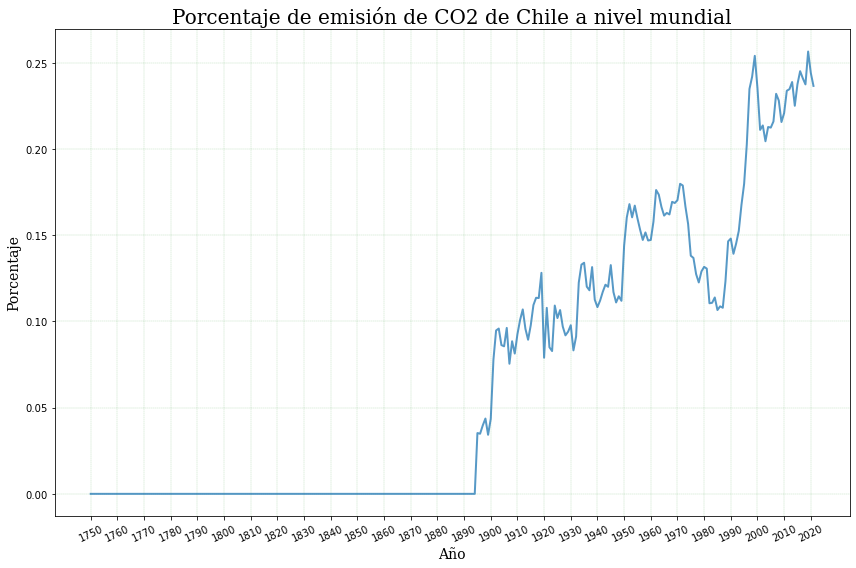

In [8]:
fig, ax = plt.subplots(figsize=(12, 8), tight_layout=True, facecolor='w')

ax.plot(df_chile['Año'], (df_chile["Total"] / df_total["Total"]) * 100,
            alpha=0.75, linewidth=2)
ax.set_title('Porcentaje de emisión de CO2 de Chile a nivel mundial', fontsize=20, fontname='serif')
ax.set_ylabel('Porcentaje', fontsize=14, fontname='serif')
ax.set_xlabel('Año', fontsize=14, fontname='serif')
ax.set_xticks(range(1750, 2022,10))
plt.xticks(rotation=25)
ax.grid(color="g", which="major", axis='both', linestyle=':', linewidth=0.25)
plt.show()

In [18]:
connection = get_connection_db()
cursor = connection.cursor()
sqlStatement = """SELECT P.nombre, SUM(C.cantidad) AS Total
                    FROM Cantidad C
                    JOIN Fecha F ON F.id_año = C.id_año
                    JOIN Tipo T ON T.id_tipo = C.id_tipo
                    JOIN Pais P ON P.id_pais = C.id_pais
                    WHERE T.nombre_residuo != "Per Capita"
                    GROUP BY P.nombre
                    ORDER BY Total DESC;"""
cursor.execute(sqlStatement)
resp = cursor.fetchall()
if (connection):
    cursor.close()
    connection.close()
    
columnas = ['País', 'Total']
df_total_sim = pd.DataFrame(resp, columns=columnas)
df_total_sim[df_total_sim["País"] == "Chile"]

,País,Total
54,Chile,2996.75197


In [9]:
connection = get_connection_db()
cursor = connection.cursor()
sqlStatement = """SELECT F.año, SUM(C.cantidad) AS emisiones_totales
                    FROM Cantidad C
                    JOIN Fecha F ON F.id_año = C.id_año
                    JOIN Tipo T ON T.id_tipo = C.id_tipo
                    JOIN Pais P ON P.id_pais = C.id_pais
                    WHERE T.nombre_residuo != "Per Capita" AND P.continente = "SA"
                    GROUP BY F.año
                    ORDER BY F.año;"""
cursor.execute(sqlStatement)
resp = cursor.fetchall()
if (connection):
    cursor.close()
    connection.close()
    
columnas = ['Año', 'Total']
df_latam = pd.DataFrame(resp, columns=columnas)
df_latam

,Año,Total
0,1750,0.000000
1,1751,0.000000
2,1752,0.000000
3,1753,0.000000
4,1754,0.000000
...,...,...
267,2017,1125.112949
268,2018,1064.608328
269,2019,1073.178275
270,2020,981.189687


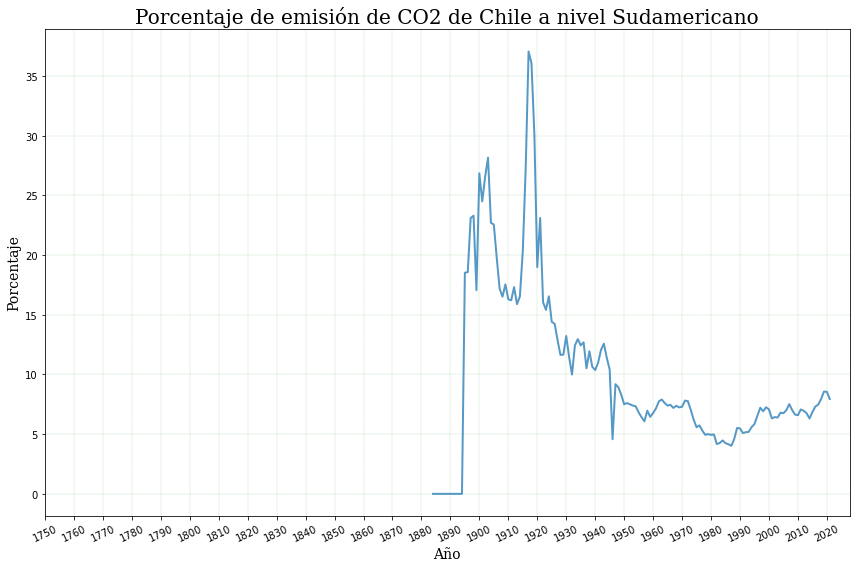

In [10]:
fig, ax = plt.subplots(figsize=(12, 8), tight_layout=True, facecolor='w')

ax.plot(df_chile['Año'], (df_chile["Total"] / df_latam["Total"]) * 100,
            alpha=0.75, linewidth=2)
ax.set_title('Porcentaje de emisión de CO2 de Chile a nivel Sudamericano', fontsize=20, fontname='serif')
ax.set_ylabel('Porcentaje', fontsize=14, fontname='serif')
ax.set_xlabel('Año', fontsize=14, fontname='serif')
ax.set_xticks(range(1750, 2022,10))
plt.xticks(rotation=25)
ax.grid(color="g", which="major", axis='both', linestyle=':', linewidth=0.25)
plt.show()

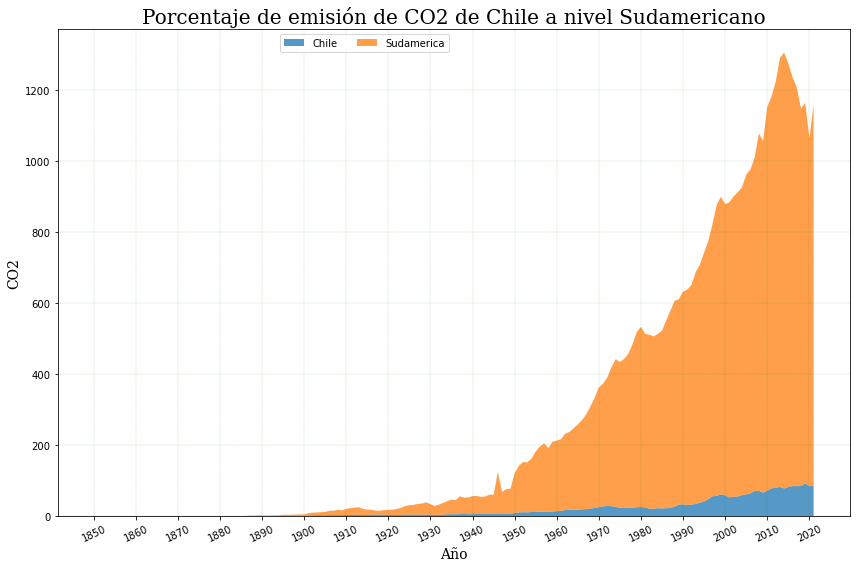

In [11]:
fig, ax = plt.subplots(figsize=(12, 8), tight_layout=True, facecolor='w')

ax.stackplot(df_chile[df_chile['Año'] > 1849]['Año'], df_chile[df_chile['Año'] > 1849]["Total"], df_latam[df_latam['Año'] > 1849]["Total"], alpha=0.75, labels=('Chile', 'Sudamerica'));
ax.set_title('Porcentaje de emisión de CO2 de Chile a nivel Sudamericano', fontsize=20, fontname='serif')
ax.set_ylabel('CO2', fontsize=14, fontname='serif')
ax.set_xlabel('Año', fontsize=14, fontname='serif')
ax.set_xticks(range(1850, 2022,10))
plt.xticks(rotation=25)
ax.legend(loc=1, ncol=5, bbox_to_anchor=(0.5, 1));
ax.grid(color="g", which="major", axis='both', linestyle=':', linewidth=0.25)
plt.show()

## Paises con emisión total similar a Chile (2021)

In [19]:
connection = get_connection_db()
cursor = connection.cursor()
sqlStatement = """SELECT SUM(C.cantidad)
                    FROM Cantidad C
                    JOIN Fecha F ON F.id_año = C.id_año
                    JOIN Tipo T ON T.id_tipo = C.id_tipo
                    JOIN Pais P ON P.id_pais = C.id_pais
                    WHERE T.nombre_residuo != "Per Capita" AND P.nombre = "Chile" AND F.año = 2021
                    GROUP BY F.año
                    ORDER BY F.año;"""
cursor.execute(sqlStatement)
resp = cursor.fetchall()
if (connection):
    cursor.close()
    connection.close()
    
total_2022 = resp[0][0]
total_2022

85.44692377466708

In [20]:
connection = get_connection_db()
cursor = connection.cursor()
sqlStatement = """SELECT P.nombre, F.año, SUM(C.cantidad)
                    FROM Cantidad C
                    JOIN Fecha F ON F.id_año = C.id_año
                    JOIN Tipo T ON T.id_tipo = C.id_tipo
                    JOIN Pais P ON P.id_pais = C.id_pais
                    WHERE P.nombre IN (SELECT P.nombre
                                        FROM Cantidad C
                                        JOIN Fecha F ON F.id_año = C.id_año
                                        JOIN Tipo T ON T.id_tipo = C.id_tipo
                                        JOIN Pais P ON P.id_pais = C.id_pais
                                        WHERE T.nombre_residuo != "Per Capita" AND F.año = 2021
                                        GROUP BY P.nombre, F.año
                                        HAVING SUM(C.cantidad) > (%s) AND SUM(C.cantidad) < (%s))
                    AND T.nombre_residuo != "Per Capita"
                    GROUP BY P.nombre, F.año
                    ORDER BY P.nombre, F.año;"""
cursor.execute(sqlStatement, (total_2022 - total_2022 * 0.15, total_2022 + total_2022 * 0.15))
resp = cursor.fetchall()
if (connection):
    cursor.close()
    connection.close()
    
columnas = ['País', 'Año', 'Total']
df_total_sim = pd.DataFrame(resp, columns=columnas)
df_total_sim

,País,Año,Total
0,Bangladesh,1750,0.000000
1,Bangladesh,1751,0.000000
2,Bangladesh,1752,0.000000
3,Bangladesh,1753,0.000000
4,Bangladesh,1754,0.000000
...,...,...,...
2987,Venezuela,2017,140.384977
2988,Venezuela,2018,102.671860
2989,Venezuela,2019,89.111143
2990,Venezuela,2020,76.467466


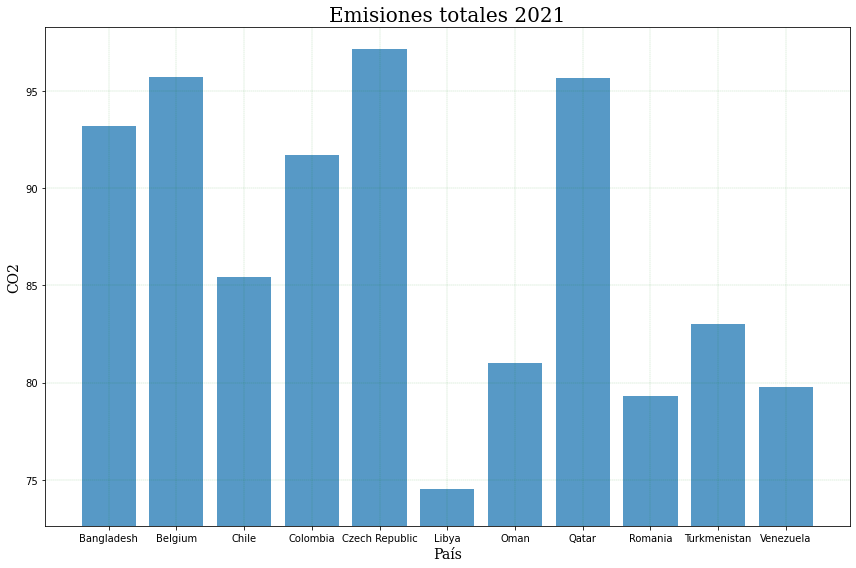

In [21]:
fig, ax = plt.subplots(figsize=(12, 8), tight_layout=True, facecolor='w')
ax.bar(df_total_sim["País"].unique(), df_total_sim[df_total_sim['Año'] == 2021]['Total'],
            alpha=0.75, linewidth=2)
ax.set_title('Emisiones totales 2021', fontsize=20, fontname='serif')
ax.set_ylabel('CO2', fontsize=14, fontname='serif')
ax.set_xlabel('País', fontsize=14, fontname='serif')
ax.set_ylim(total_2022 - total_2022 * 0.15, total_2022 + total_2022 * 0.15)
ax.grid(color="g", which="major", axis='both', linestyle=':', linewidth=0.25)
plt.show()

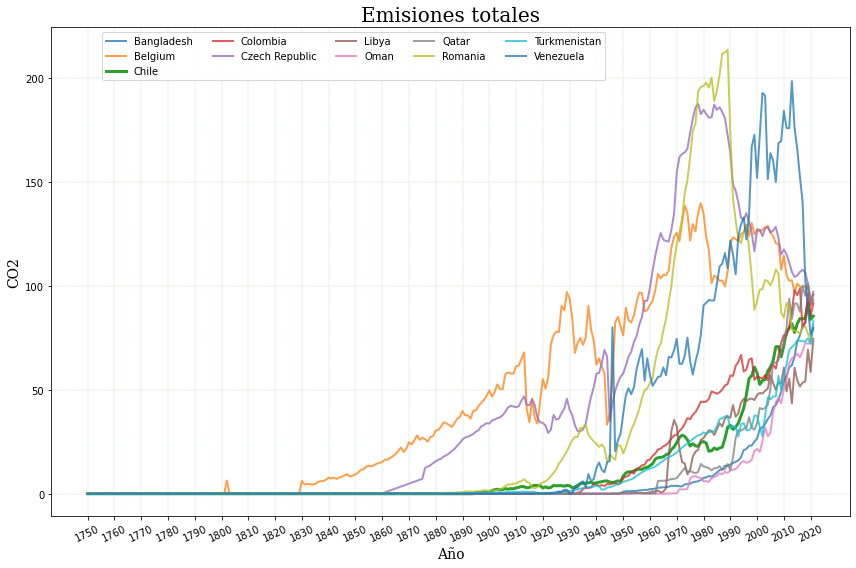

In [22]:
fig, ax = plt.subplots(figsize=(12, 8), tight_layout=True, facecolor='w')
for i in df_total_sim["País"].unique():
    if i == "Chile":
        ax.plot(df_total_sim[df_total_sim['País'] == i]['Año'], df_total_sim[df_total_sim['País'] == i]['Total'],
                label=i, linewidth=3)     
    else:
        ax.plot(df_total_sim[df_total_sim['País'] == i]['Año'], df_total_sim[df_total_sim['País'] == i]['Total'],
                alpha=0.75, label=i, linewidth=2)
ax.set_title('Emisiones totales', fontsize=20, fontname='serif')
ax.set_ylabel('CO2', fontsize=14, fontname='serif')
ax.set_xlabel('Año', fontsize=14, fontname='serif')
ax.set_xticks(range(1750, 2022,10))
plt.xticks(rotation=25)
ax.grid(color="g", which="major", axis='both', linestyle=':', linewidth=0.25)
ax.legend(loc=1, ncol=5, bbox_to_anchor=(0.7, 1));
plt.show()

## Paises con emisión per cápita similar a Chile (2021)

In [12]:
connection = get_connection_db()
cursor = connection.cursor()
sqlStatement = """SELECT C.cantidad
                    FROM Cantidad C
                    JOIN Fecha F ON F.id_año = C.id_año
                    JOIN Tipo T ON T.id_tipo = C.id_tipo
                    JOIN Pais P ON P.id_pais = C.id_pais
                    WHERE T.nombre_residuo = "Per Capita" AND P.nombre = "Chile" AND F.año = 2021
                    GROUP BY F.año
                    ORDER BY F.año;"""
cursor.execute(sqlStatement)
resp = cursor.fetchall()
if (connection):
    cursor.close()
    connection.close()
    
per_capita_2022 = resp[0][0]

In [13]:
no_cero = df_chile[df_chile["Total"] != 0]["Año"].iloc[0]

connection = get_connection_db()
cursor = connection.cursor()
sqlStatement = """SELECT P.nombre, F.año, C.cantidad
                    FROM Cantidad C
                    JOIN Fecha F ON F.id_año = C.id_año
                    JOIN Tipo T ON T.id_tipo = C.id_tipo
                    JOIN Pais P ON P.id_pais = C.id_pais
                    WHERE P.nombre IN (SELECT P.nombre
                                        FROM Cantidad C
                                        JOIN Fecha F ON F.id_año = C.id_año
                                        JOIN Tipo T ON T.id_tipo = C.id_tipo
                                        JOIN Pais P ON P.id_pais = C.id_pais
                                        WHERE T.nombre_residuo = "Per Capita" AND C.cantidad > (%s) 
                                        AND C.cantidad < (%s) AND F.año = 2021)
                    AND T.nombre_residuo = "Per Capita" AND F.año >= (%s)
                    ORDER BY P.nombre, F.año;"""
cursor.execute(sqlStatement, (per_capita_2022 - per_capita_2022 * 0.05, per_capita_2022 + per_capita_2022 * 0.05, no_cero))
resp = cursor.fetchall()
if (connection):
    cursor.close()
    connection.close()
    
columnas = ['País', 'Año', 'Per Capita']
df_per_capita = pd.DataFrame(resp, columns=columnas)
df_per_capita

,País,Año,Per Capita
0,Chile,1895,0.188257
1,Chile,1896,0.189810
2,Chile,1897,0.223425
3,Chile,1898,0.256222
4,Chile,1899,0.216798
...,...,...,...
1011,Suriname,2017,3.593340
1012,Suriname,2018,3.148780
1013,Suriname,2019,4.469210
1014,Suriname,2020,4.295480


In [14]:
df_per_capita["País"].unique()

array(['Chile', 'Croatia', 'Hong Kong', 'Iraq', 'Lebanon', 'Réunion',
       'Serbia', 'Suriname'], dtype=object)

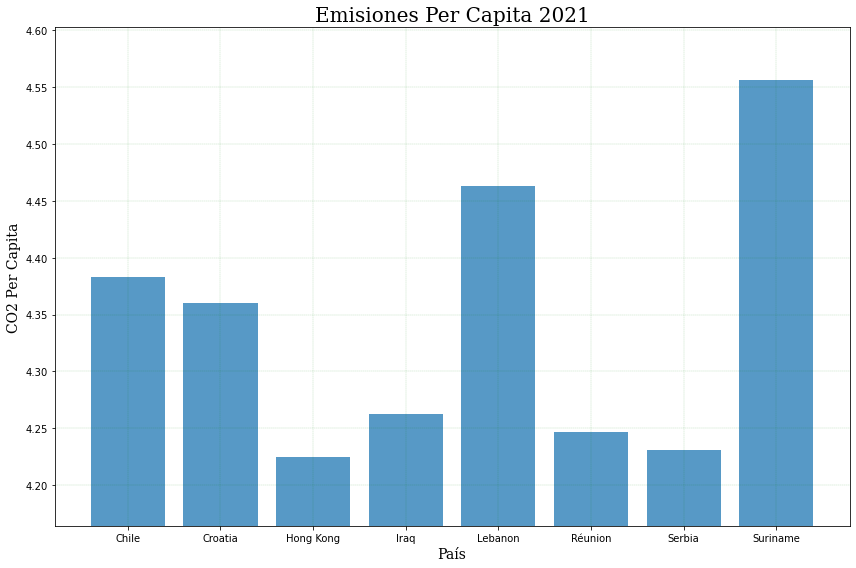

In [15]:
fig, ax = plt.subplots(figsize=(12, 8), tight_layout=True, facecolor='w')
ax.bar(df_per_capita["País"].unique(), df_per_capita[df_per_capita['Año'] == 2021]['Per Capita'],
            alpha=0.75, linewidth=2)
ax.set_title('Emisiones Per Capita 2021', fontsize=20, fontname='serif')
ax.set_ylabel('CO2 Per Capita', fontsize=14, fontname='serif')
ax.set_xlabel('País', fontsize=14, fontname='serif')
ax.set_ylim(per_capita_2022 - per_capita_2022 * 0.05, per_capita_2022 + per_capita_2022 * 0.05)
ax.grid(color="g", which="major", axis='both', linestyle=':', linewidth=0.25)
plt.show()

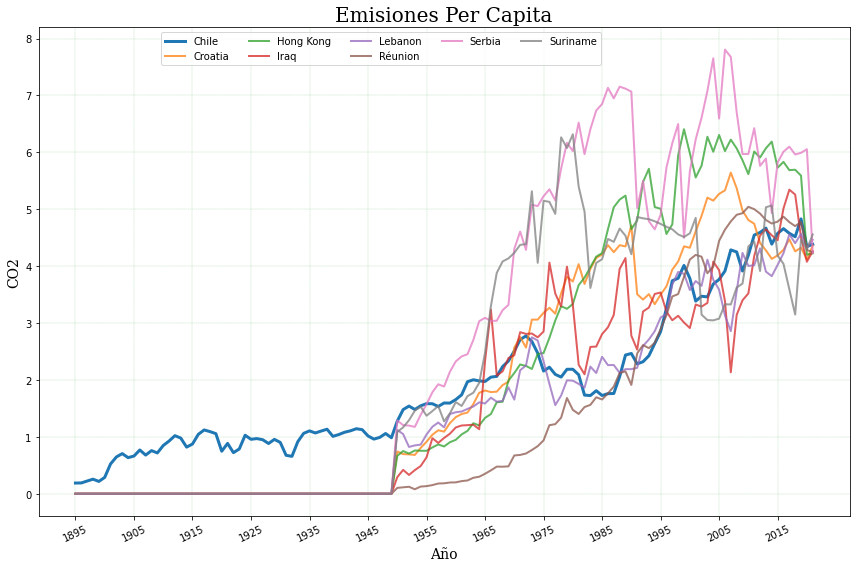

In [16]:
fig, ax = plt.subplots(figsize=(12, 8), tight_layout=True, facecolor='w')
for i in df_per_capita["País"].unique():
    if i == "Chile":
        ax.plot(df_per_capita[df_per_capita['País'] == i]['Año'], df_per_capita[df_per_capita['País'] == i]['Per Capita'],
                label=i, linewidth=3)     
    else:
        ax.plot(df_per_capita[df_per_capita['País'] == i]['Año'], df_per_capita[df_per_capita['País'] == i]['Per Capita'],
                alpha=0.75, label=i, linewidth=2)
ax.set_title('Emisiones Per Capita', fontsize=20, fontname='serif')
ax.set_ylabel('CO2', fontsize=14, fontname='serif')
ax.set_xlabel('Año', fontsize=14, fontname='serif')
ax.set_xticks(range(no_cero, 2022,10))
plt.xticks(rotation=25)
ax.grid(color="g", which="major", axis='both', linestyle=':', linewidth=0.25)
ax.legend(loc=1, ncol=5, bbox_to_anchor=(0.7, 1));
plt.show()

## Contaminación que emite chile por a lo largo de los años

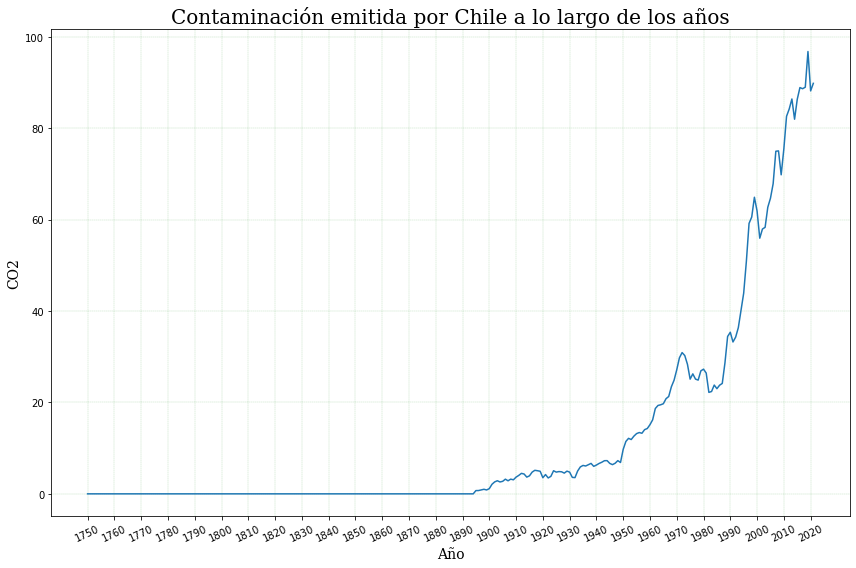

In [35]:
# Obtener datos de la base de datos
connection = get_connection_db()
cursor = connection.cursor()
query = """SELECT F.año, SUM(C.cantidad) AS total_contaminacion
            FROM Pais P
            JOIN Cantidad C ON P.id_pais = C.id_pais
            JOIN Fecha F ON F.id_año = C.id_año
            WHERE P.nombre = 'Chile'
            GROUP BY F.año
            ORDER BY F.año;
        """
cursor.execute(query)

fechas = []
total_contaminacion = []

for fecha, contaminacion in cursor:
    fechas.append(fecha)
    total_contaminacion.append(contaminacion)

# Graficar los datos
fig, ax = plt.subplots(figsize=(12, 8), tight_layout=True, facecolor='w')

ax.plot(fechas, total_contaminacion)
ax.set_title('Contaminación emitida por Chile a lo largo de los años', fontsize=20, fontname='serif')
ax.set_ylabel('CO2', fontsize=14, fontname='serif')
ax.set_xlabel('Año', fontsize=14, fontname='serif')
ax.set_xticks(range(1750, 2022,10))
plt.xticks(rotation=25)
ax.grid(color="g", which="major", axis='both', linestyle=':', linewidth=0.25)

plt.show()

# Cerrar la conexión a la base de datos
cursor.close()
connection.close()

## Emisiones por tipo de residuo en Chile

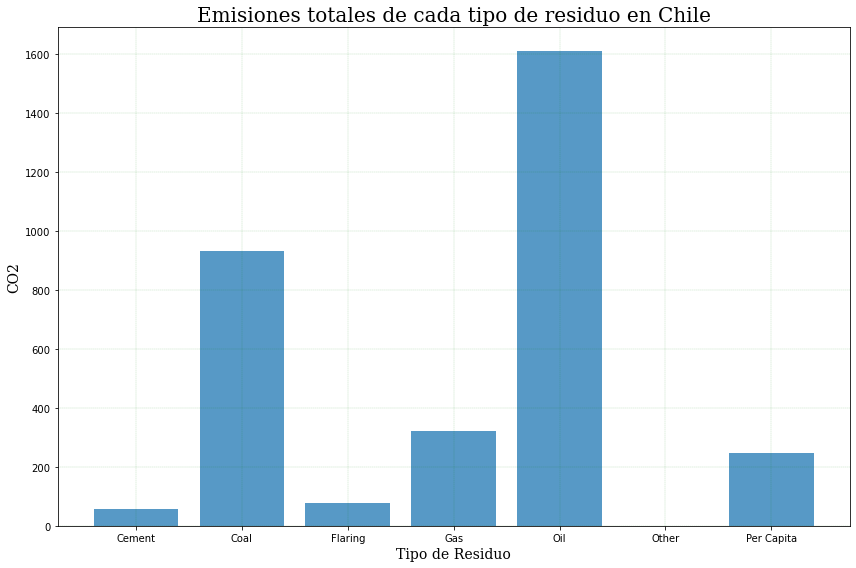

In [36]:
# Obtener datos de la base de datos
connection = get_connection_db()
cursor = connection.cursor()
query = """ SELECT T.nombre_residuo AS tipo_residuo, SUM(C.cantidad) AS emisiones_totales
            FROM Pais P
            JOIN Cantidad C ON P.id_pais = C.id_pais
            JOIN Tipo T ON T.id_tipo = C.id_tipo
            WHERE P.nombre = 'Chile'
            GROUP BY T.nombre_residuo
            ORDER BY T.nombre_residuo;
        """
cursor.execute(query)

# Crear listas para almacenar los datos
tipos_residuo = []
emisiones_totales = []

for tipo_residuo, emisiones in cursor:
    tipos_residuo.append(tipo_residuo)
    emisiones_totales.append(emisiones)

# Graficar los datos
fig, ax = plt.subplots(figsize=(12, 8), tight_layout=True, facecolor='w')
ax.bar(tipos_residuo, emisiones_totales,
            alpha=0.75, linewidth=2)
ax.set_title('Emisiones totales de cada tipo de residuo en Chile', fontsize=20, fontname='serif')
ax.set_ylabel('CO2', fontsize=14, fontname='serif')
ax.set_xlabel('Tipo de Residuo', fontsize=14, fontname='serif')
ax.grid(color="g", which="major", axis='both', linestyle=':', linewidth=0.25)

plt.show()

# Cerrar la conexión a la base de datos
cursor.close()
connection.close()

Coal
Per Capita
Cement
Gas
Oil
Flaring


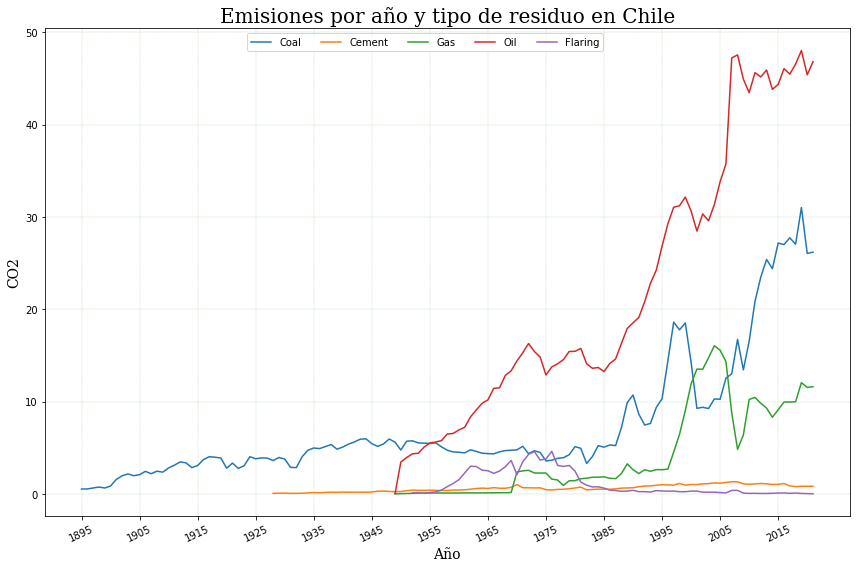

In [38]:
connection = get_connection_db()
cursor = connection.cursor()
query = """SELECT F.año, T.nombre_residuo, SUM(C.cantidad) AS emisiones
            FROM Pais P
            JOIN Cantidad C ON P.id_pais = C.id_pais
            JOIN Fecha F ON F.id_año = C.id_año
            JOIN Tipo T ON T.id_tipo = C.id_tipo
            WHERE P.nombre = 'Chile'
            GROUP BY F.año, T.nombre_residuo
            ORDER BY F.año, T.nombre_residuo;
        """
cursor.execute(query)

# Crear diccionario para almacenar los datos por tipo de residuo
datos_por_residuo = {}

for fecha, tipo_residuo, emisiones in cursor:
    if emisiones > 0:  # Filtrar emisiones mayores a 0
        if tipo_residuo not in datos_por_residuo:
            datos_por_residuo[tipo_residuo] = {'fechas': [], 'emisiones': []}
        
        datos_por_residuo[tipo_residuo]['fechas'].append(fecha)
        datos_por_residuo[tipo_residuo]['emisiones'].append(emisiones)

# Graficar los datos
fig, ax = plt.subplots(figsize=(12, 8), tight_layout=True, facecolor='w')
for tipo_residuo, datos in datos_por_residuo.items():
    print(tipo_residuo)
    if (tipo_residuo!="Per Capita"):
        
        ax.plot(datos['fechas'], datos['emisiones'], label=tipo_residuo)

ax.set_title('Emisiones por año y tipo de residuo en Chile', fontsize=20, fontname='serif')
ax.set_ylabel('CO2', fontsize=14, fontname='serif')
ax.set_xlabel('Año', fontsize=14, fontname='serif')
ax.set_xticks(range(no_cero, 2022,10))
plt.xticks(rotation=25)
ax.grid(color="g", which="major", axis='both', linestyle=':', linewidth=0.25)
ax.legend(loc=1, ncol=5, bbox_to_anchor=(0.7, 1));
plt.show()
# Cerrar la conexión a la base de datos
cursor.close()
connection.close()

## Tendencia

In [23]:
connection = get_connection_db()
cursor = connection.cursor()
sqlStatement = """SELECT F.año, SUM(C.cantidad) AS emisiones_totales
                    FROM Cantidad C
                    JOIN Fecha F ON F.id_año = C.id_año
                    JOIN Tipo T ON T.id_tipo = C.id_tipo
                    JOIN Pais P ON P.id_pais = C.id_pais
                    WHERE T.nombre_residuo != "Per Capita" AND P.nombre = "Chile"
                    GROUP BY F.año
                    ORDER BY F.año;"""
cursor.execute(sqlStatement)
resp = cursor.fetchall()
if (connection):
    cursor.close()
    connection.close()
    
columnas = ['Año', 'Total']
df_chile = pd.DataFrame(resp, columns=columnas)
df_chile

,Año,Total
0,1750,0.000000
1,1751,0.000000
2,1752,0.000000
3,1753,0.000000
4,1754,0.000000
...,...,...
267,2017,84.074593
268,2018,84.468694
269,2019,91.961935
270,2020,83.833801


In [44]:
# Datos de muestra
x = df_chile.iloc[:, 0:-1].values
y = df_chile["Total"].values

# Transformación polinomial de grado 8
poly_features = PolynomialFeatures(degree=8)
x_poly = poly_features.fit_transform(x)

# Crear un modelo de regresión lineal
model = LinearRegression()

# Entrenar el modelo con los datos transformados
model.fit(x_poly, y)

LinearRegression()

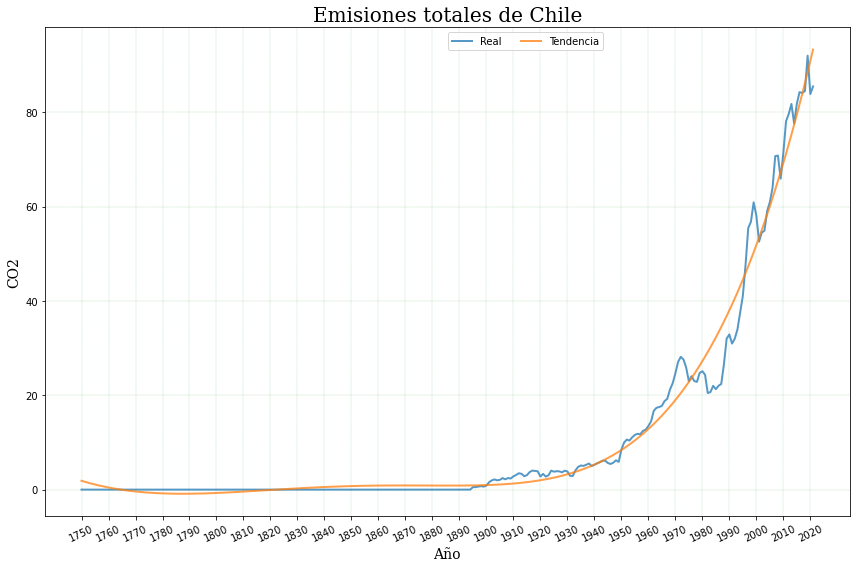

In [45]:
fig, ax = plt.subplots(figsize=(12, 8), tight_layout=True, facecolor='w')

ax.plot(df_chile['Año'], df_chile['Total'],
        alpha=0.75, label="Real", linewidth=2)
ax.plot(x, model.predict(x_poly),
        alpha=0.75, label="Tendencia", linewidth=2)

ax.set_title('Emisiones totales de Chile', fontsize=20, fontname='serif')
ax.set_ylabel('CO2', fontsize=14, fontname='serif')
ax.set_xlabel('Año', fontsize=14, fontname='serif')
ax.set_xticks(range(1750, 2022,10))
plt.xticks(rotation=25)
ax.grid(color="g", which="major", axis='both', linestyle=':', linewidth=0.25)
ax.legend(loc=1, ncol=5, bbox_to_anchor=(0.7, 1));
plt.show()

In [40]:
mean_squared_error(df_chile['Total'], model.predict(x_poly))

7.839639913500781